# Hydrocal
### A python package for the reduction of hydration calorimetry data
Michael L. Whittaker    
Jan 1 2025  
Lawrence Berkeley National Labortatory  

## Step 1: Import libraries
- external: numpy, matplotlib.pyplot
- internal: Preprocess, Analyze utilities
    - Plot and Dataloader imported implicitly

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from utils.hydrocal_preprocess import Preprocess
from utils.hydrocal_analyze import Analyze

## Step 2: Load data with Preprocess
- separate data into 'results' and 'method' folders
- one method may correspond to many results, which can all be loaded together if they are in the same directory
- data will be referenced by their filenames (without extension)

In [2]:
MW123_data = Preprocess("test_data/123_hydration/", extension='csv', method_extension='txt', delimiter=',')


Method assignments for 'MW2_123':
  Experiment 1 -> MW2_123A  (exp duration: 16200 s, method duration: 16200 s)
  Experiment 2 -> MW2_123B  (exp duration: 30600 s, method duration: 30600 s)
  Experiment 3 -> MW2_123C  (exp duration: 59400 s, method duration: 59400 s)
  Experiment 4 -> MW2_123D  (exp duration: 9000 s, method duration: 9000 s)


## Step 3: Examine method, data, data gradient, data statistics, and perform principal component analysis
- check method for consistency
    - the method file is used to parse data
- check data for quality and characteristics
- check gradient for trends and outliers
- examine data statistics to inspect for variability
- optionally, examine Fourier transform and its PCA 

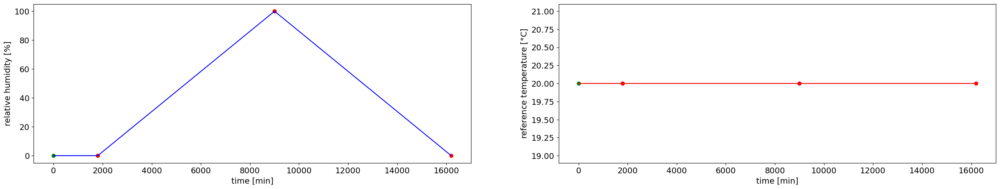

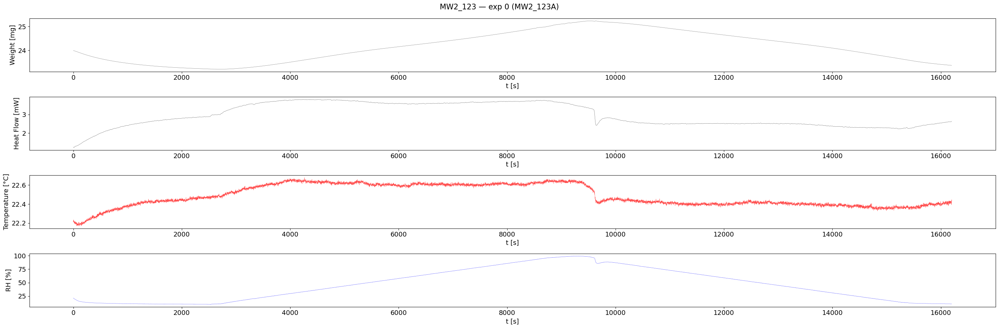

In [3]:
MW123_data.plot.plot_method('MW2_123A')
MW123_data.data_view('MW2_123', experiment='MW2_123A')

In [ ]:
MG_data.data_view('MG-GrenCalc1-153')
MG_data.data_gradient('MG-GrenCalc1-153')
MG_data.data_stats('MG-GrenCalc1-153')
MG_data.data_pca('MG-GrenCalc1-153')
MG_data.background_pca('MG-GrenCalc1-153')
MG_data.data_fpca('MG-GrenCalc1-153', n_basis=38, fpca_reconstruction_components=37)

MG_data.data_fft('MG-GrenCalc2-153') # can be used to find instrument time constant
MG_data.data_fftpca('MG-GrenCalc2-153')

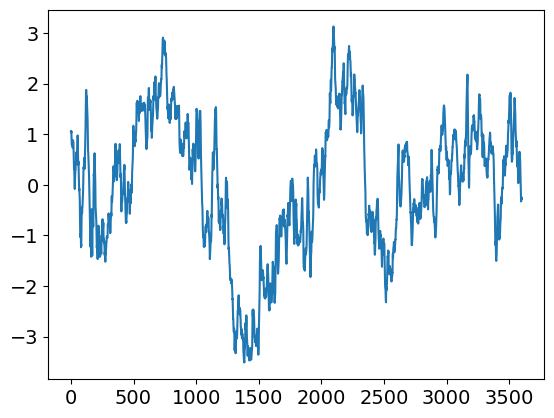

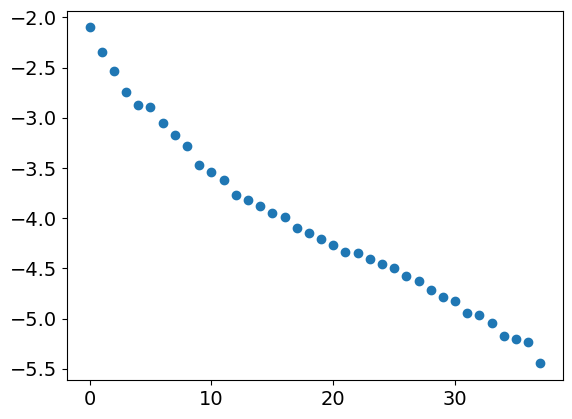

In [182]:
test = MG_data.pca['MG-GrenCalc1-153']['HF_pca_fit2']
test2 = MG_data.pca['MG-GrenCalc1-153']['HF_pca2']

plt.plot(test.T[3])
plt.show()

test2_evr = test2.explained_variance_ratio_[:-1]
plt.scatter(np.arange(len(test2_evr)), np.log(test2_evr))

In [ ]:
hf_total = np.sum(MG_data.fpca['MG-GrenCalc2-153']['ndata_HF'][1:21] - MG_data.fpca['MG-GrenCalc2-153']['ndata_HF'][1][0])
weight_change = np.max(MG_data.fpca['MG-GrenCalc2-153']['ndata_Weight'][1:21]) - np.min(MG_data.fpca['MG-GrenCalc1-153']['ndata_Weight'][1:21])
hf_total / weight_change

np.float64(41979.94280276448)

In [22]:
hf_total = np.sum(MG_data.fpca['MG-GrenCalc2-153']['ndata_HF'][20:] - MG_data.fpca['MG-GrenCalc2-153']['ndata_HF'][20][0])
weight_change = np.max(MG_data.fpca['MG-GrenCalc2-153']['ndata_Weight'][20]) - np.min(MG_data.fpca['MG-GrenCalc2-153']['ndata_Weight'][20:])
hf_total / weight_change

np.float64(40454.65001805811)

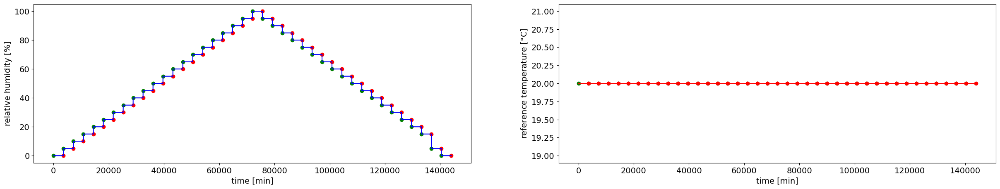

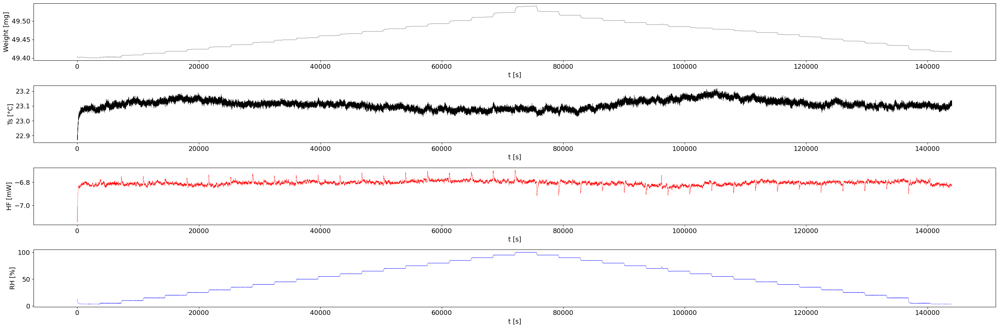

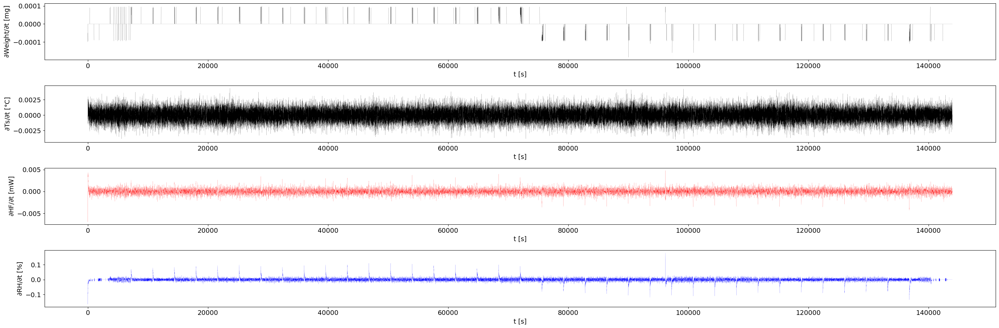

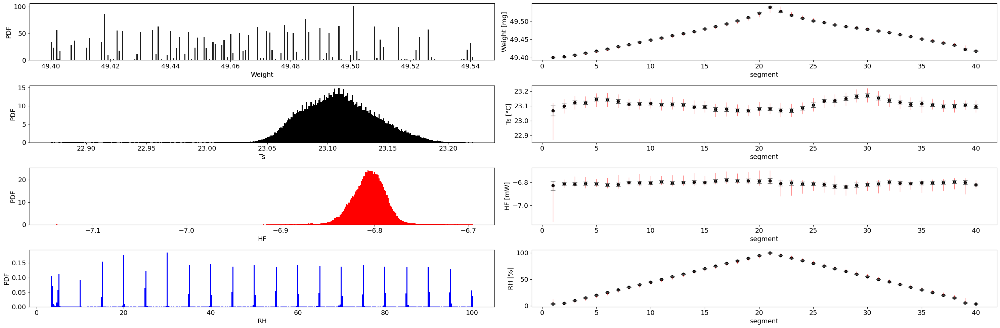

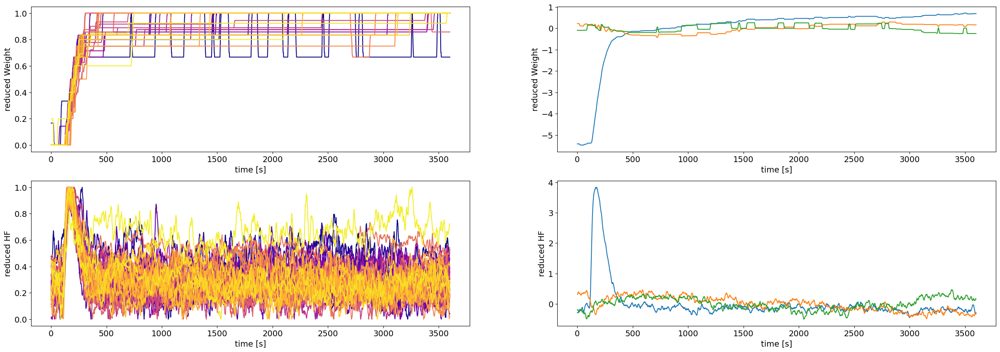

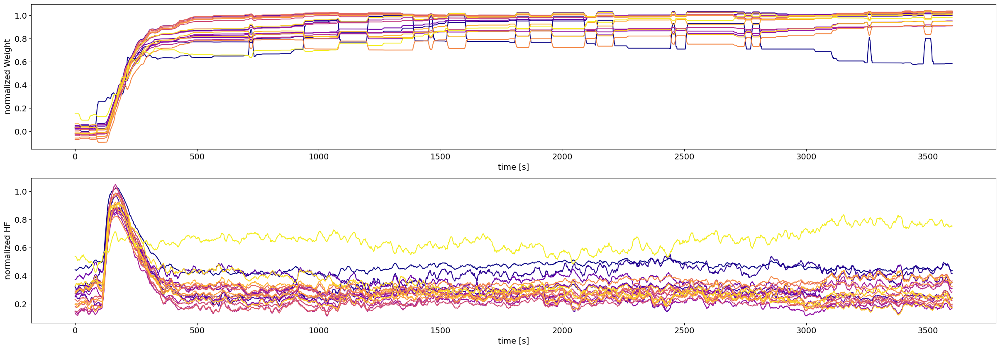

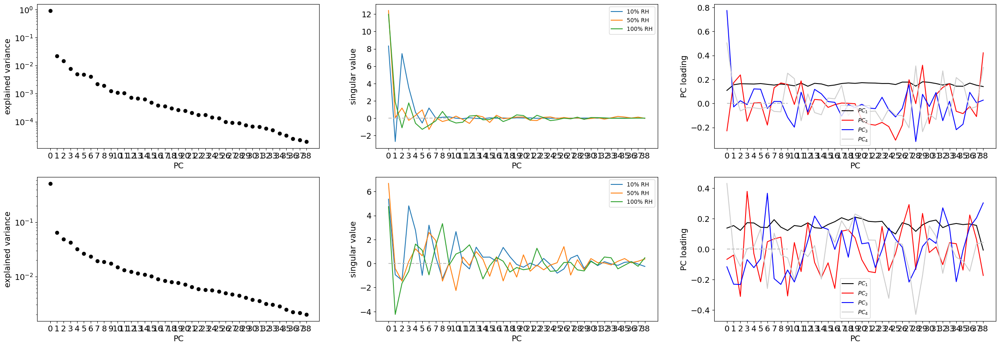

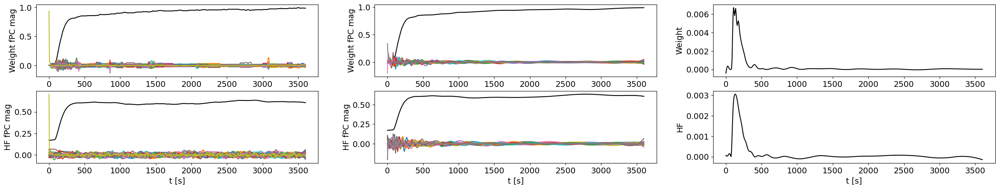

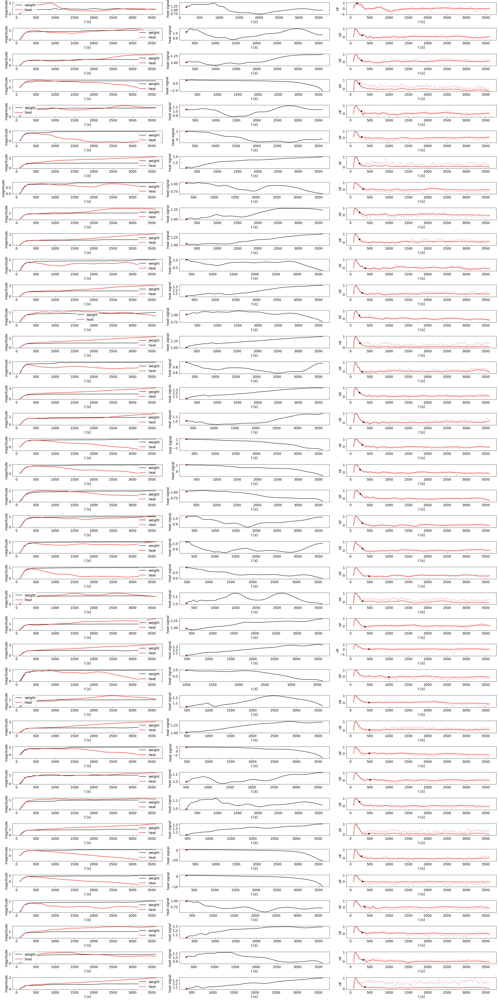

In [20]:
MG_data.plot.plot_method()
MG_data.data_view('MG-GrenCalc2-153')
MG_data.data_gradient('MG-GrenCalc2-153')
MG_data.data_stats('MG-GrenCalc2-153')
MG_data.data_pca('MG-GrenCalc2-153')
MG_data.data_fpca('MG-GrenCalc2-153', n_basis=38, fpca_reconstruction_components=37)

# MG_data.data_fft('MG-GrenCalc1-153')
# MG_data.data_fftpca('MG-GrenCalc1-153')

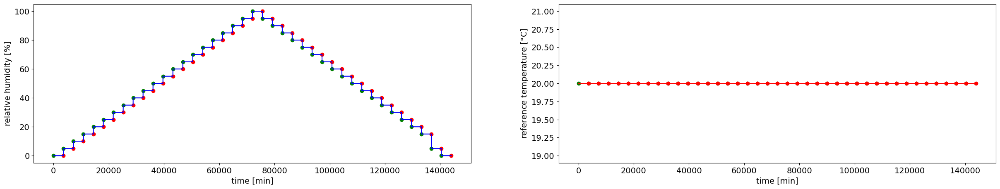

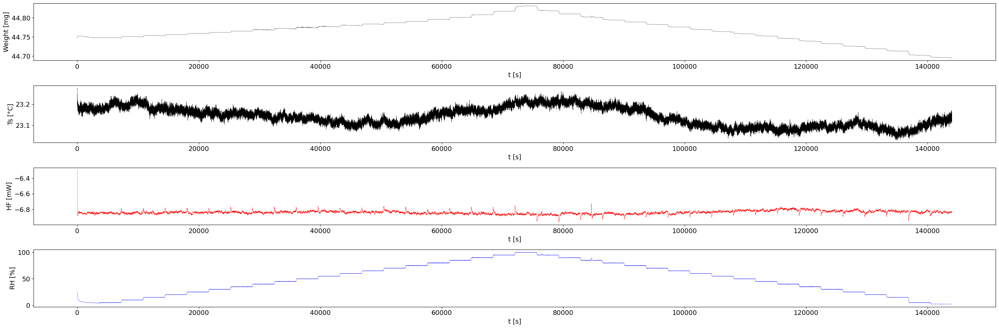

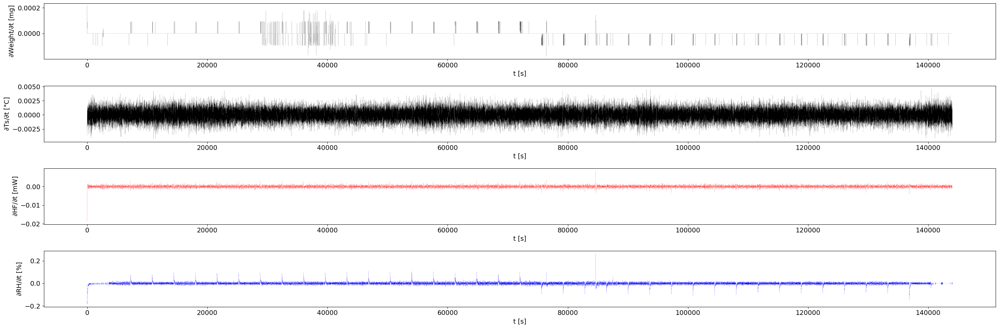

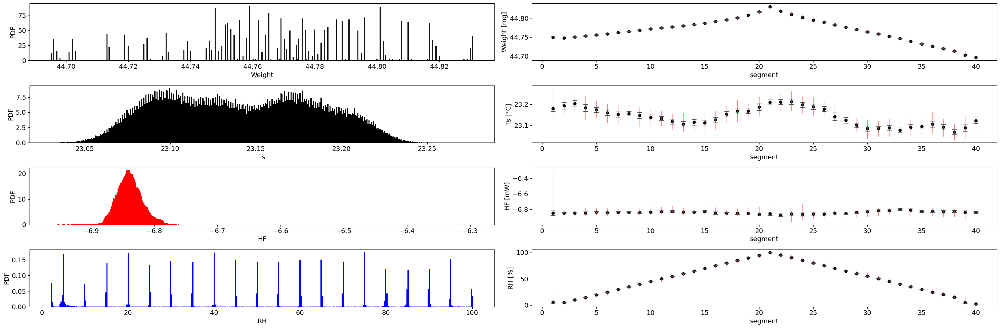

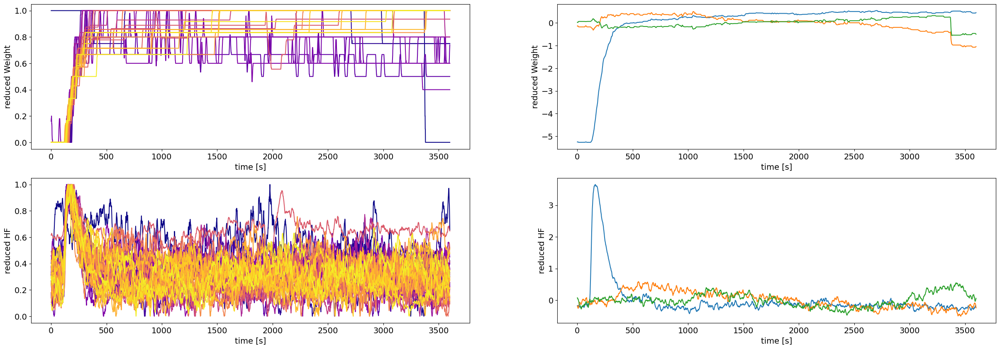

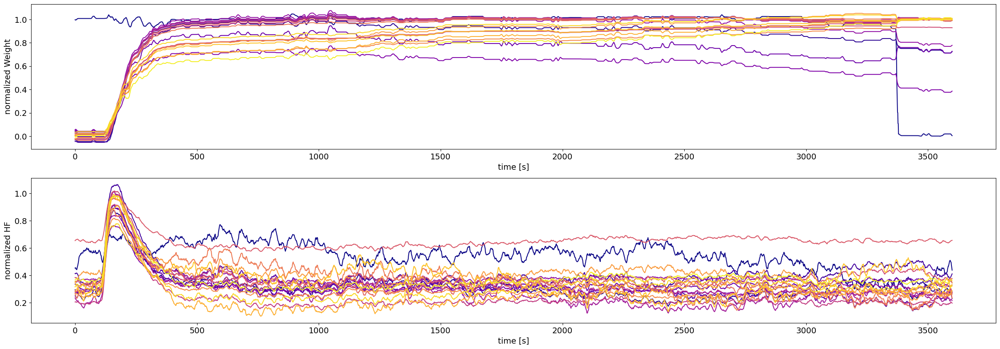

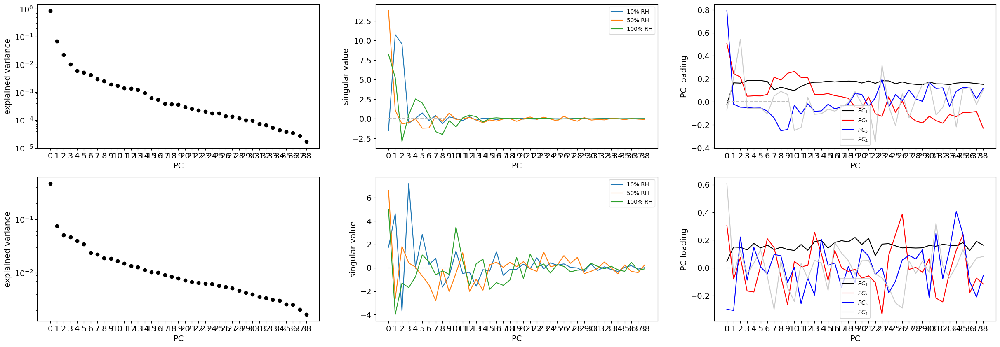

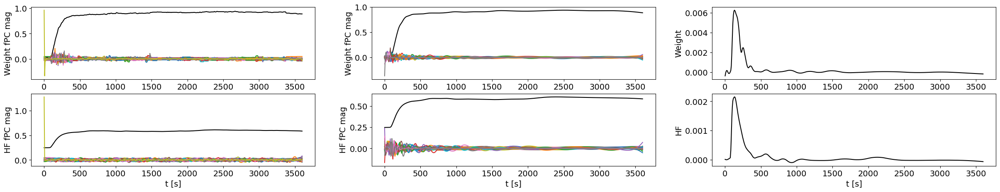

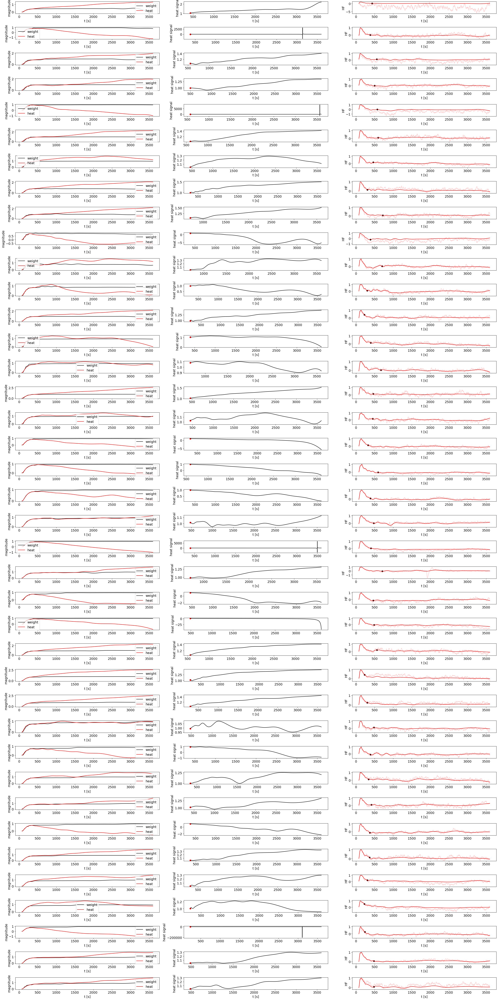

In [23]:
MG_data.plot.plot_method()
MG_data.data_view('MG-GrenCalc3-153 compacted')
MG_data.data_gradient('MG-GrenCalc3-153 compacted')
MG_data.data_stats('MG-GrenCalc3-153 compacted')
MG_data.data_pca('MG-GrenCalc3-153 compacted')
MG_data.data_fpca('MG-GrenCalc3-153 compacted', n_basis=38, fpca_reconstruction_components=37)

# MG_data.data_fft('MG-GrenCalc1-153')
# MG_data.data_fftpca('MG-GrenCalc1-153')

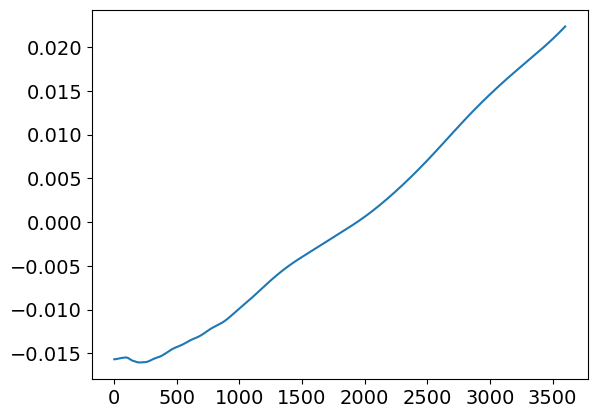

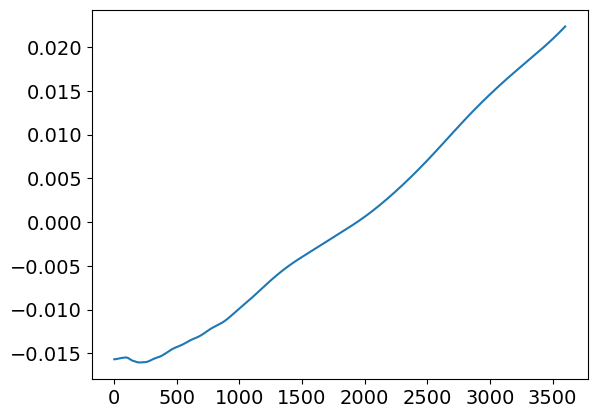

In [24]:
MG_data.fpca['MG-GrenCalc1-153']['fpca_HF'].components_[0].plot()

## Step 4: Analyze preprocessed data
- inverse Laplace transform to find time constants and amplitudes
- power transform to check for outliers or bad fits
- least squares fitting with Laplace parameters as initial guesses

In [25]:
MG_analysis = Analyze(MG_data) # initialize Analysis object with Preprocess object

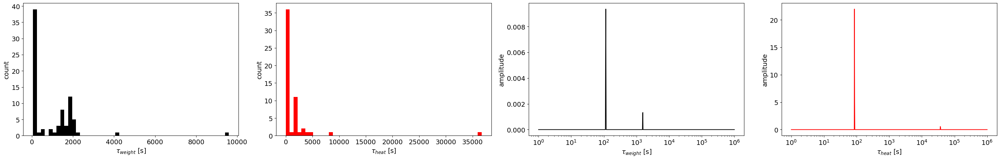

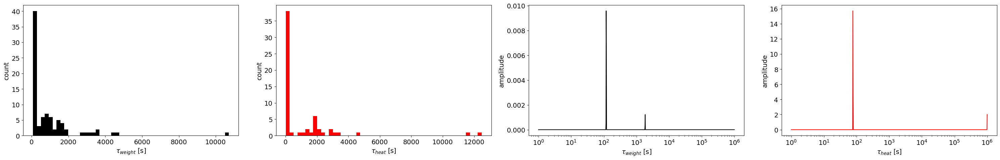

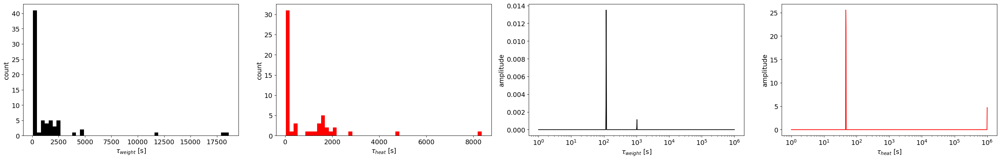

/Users/mwhittaker/Projects/github/hydrocal/utils/hydrocal_analyze.py:218: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


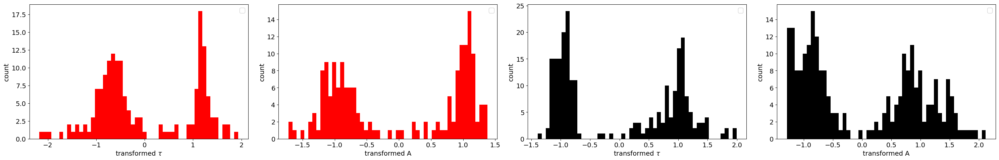

In [28]:
MG_analysis.inverse_laplace_fit('MG-GrenCalc1-153')
MG_analysis.inverse_laplace_fit('MG-GrenCalc2-153')
MG_analysis.inverse_laplace_fit('MG-GrenCalc3-153 compacted')
MG_analysis.power_transform()

/Users/mwhittaker/Projects/github/hydrocal/utils/hydrocal_analyze.py:35: RuntimeWarning: overflow encountered in exp
  y += A * np.exp(-t / tau)


RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
UnboundLocalError encountered: cannot access local variable 'heat_fitted_curve' where it is not associated with a value
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
UnboundLocalError encountered: cannot access local variable 'heat_fitted_curve' where it is not associated with a value
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
UnboundLocalError encountered: cannot access local variable 'heat_fitted_curve' where it is not associated with a value
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
UnboundLocalError encountered: cannot access local variable 'heat_fitted_curve' where it is not associated with a value
segment: 4
weight_params: [ 5.56327561e-03  5.79369475e+01 -6.55796104e-04  

/Users/mwhittaker/Projects/github/hydrocal/utils/hydrocal_analyze.py:35: RuntimeWarning: overflow encountered in multiply
  y += A * np.exp(-t / tau)


RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
segment: 25
weight_params: [ 5.56327516e-03  5.79369366e+01 -6.55796589e-04  2.94261383e+03
  2.38250577e-03  1.35274824e+02  3.81033436e-03  8.49183699e+02]
heat_params: [ 3.82430082e-02  3.55974463e+03  6.70093351e+01  2.79564933e+02
 -6.69015843e+01  2.80181476e+02 -1.65165560e-01  2.91072230e+01]
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
RuntimeError encountered: Optimal parameters not found: Number of calls to function has reached maxfev = 1800.
segment: 29
weight_params: [ 5.56327514e-03  5.79369363e+01 -6.55796605e-04  2.94261388e+03
  2.38250575e-03  1.35274819e+02  3.81033434e-03  8

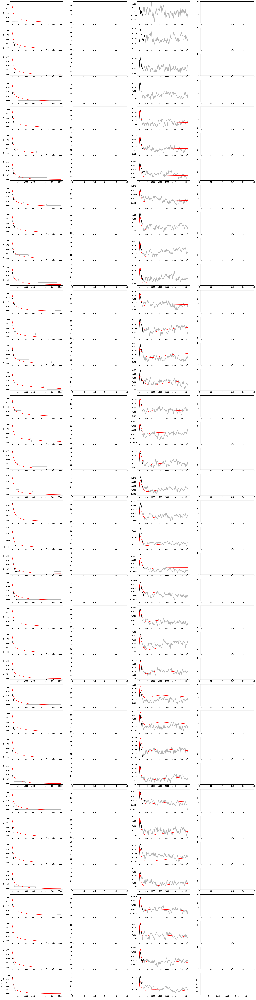

In [27]:
MG_analysis.parameter_guess('MG-GrenCalc1-153')
MG_analysis.exponential_fit('MG-GrenCalc1-153')